In [2]:
import numpy as np
from astropy.table import Table
from matplotlib import pyplot as plt
from astropy.coordinates import SkyCoord
from astropy import units as u
%matplotlib inline
from matplotlib.backends.backend_pdf import PdfPages
from scipy.special import erfinv, erf
from scipy.stats import poisson

Define functions to convert fluxes in mag and viceversa, v2m1-4 variables are the offset from vega to AB for W1-4

Used Table 1 Zero Magnitude Flux Density from here:
https://wise2.ipac.caltech.edu/docs/release/allsky/expsup/sec4_4h.html#Summary

In [3]:
def mag_to_flux(mag):
    ms = mag.shape[0]
    f0 = np.tile(np.array([309.54,171.787,31.674,8.363]),(ms,1))
    return f0*10**(-mag/2.5)

def flux_to_mag(flux):
    ms = flux.shape[0]
    f0 = np.tile(np.array([309.54,171.787,31.674,8.363]),(ms,1))
    return np.log10(flux/f0)*2.5


f0 = np.tile(np.array([309.54,171.787,31.674,8.363]),(1,1))
print(f0.shape)

def flux2AB_W1(f):
    vega=22.5-2.5*np.log10(f)
    return vega+2.699
def flux2AB_W2(f):
    vega=22.5-2.5*np.log10(f)
    return vega+3.339

v2m1 = 2.699
v2m2 = 3.339
v2m3 = 5.174
v2m4 = 6.620


(1, 4)


The catalog sumss_allwise_unwise_900.vot is a catalog of all SUMSS sources with total flux > 900 mJy, cross-correlated with unWISE and AllWISE catalogs.
If multiple sources are associated in unWISE (within 5") I just take the one with larger W1 flux

In [4]:
cat = Table.read("sumss_allwise_unwise_900.vot")
tu = np.unique(cat["AllWISE"])
for i in tu:
    ii = np.where(cat["AllWISE"] == i)[0]
    if len(ii)>1:
        maxf = np.argmax(cat["FW1"][ii])
        cat.remove_rows(ii[np.delete(range(len(ii)),maxf)])

This part is a bit twisted for laziness, but the bottom line is that I replace AllWISE W1, W2 fluxes and magnitudes with unWISE W1, W2 fluxes and magnitudes, and move everything to AB

In [5]:
W1=cat["W1mag"]+v2m1
W2=cat["W2mag"]+v2m2
W3=cat["W3mag"]+v2m3
W4=cat["W4mag"]+v2m4
eW1=cat["e_W1mag"]
eW2=cat["e_W2mag"]
eW3=cat["e_W3mag"]
eW4=cat["e_W4mag"]
uW1 = flux2AB_W1(cat["FW1"])
uW2 = flux2AB_W2(cat["FW2"])

cmags = np.array([W1,W2,W3,W4]).T
cmagsp = np.array([W1+eW1,W2+eW2,W3+eW3,W4+eW4]).T
cmagsm = np.array([W1-eW1,W2-eW2,W3-eW3,W4-eW4]).T

ucmags = np.array([uW1,uW2,W3,W4]).T

print(cmags.shape)
fmags = mag_to_flux(cmags)
ufmags = mag_to_flux(ucmags)
fmagsp = mag_to_flux(cmagsp)
fmagsm = mag_to_flux(cmagsm)

dfmags=(np.abs(fmagsm-fmags)+np.abs(fmagsp-fmags))/2
udfmags=(np.abs(fmagsm-fmags)+np.abs(fmagsp-fmags))/2

cfw1=np.median(ufmags[:,0]/cat["FW1"])
cfw2=np.median(ufmags[:,1]/cat["FW2"])
udfmags[:,0]=cat["e_FW1"]*cfw1
udfmags[:,1]=cat["e_FW2"]*cfw2

udcmags = 0.5*(np.abs(flux_to_mag(ufmags+udfmags) - flux_to_mag(ufmags)
                ) + np.abs(flux_to_mag(ufmags-udfmags) - flux_to_mag(ufmags)))

(691, 4)


/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:16: RuntimeWarning: divide by zero encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:19: RuntimeWarning: divide by zero encountered in log10
  vega=22.5-2.5*np.log10(f)
/opt/anaconda3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:746: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedColumn.
  a.partition(kth, axis=axis, kind=kind, order=order)


Same as before, but for the Spiderweb, for which allwise and unwise informations have been extracted in the file spiderweb_allwise_unwise.vot

In [6]:
spid=Table.read("spiderweb_allwise_unwise.vot")
sW1=spid["W1mag"]+v2m1
sW2=spid["W2mag"]+v2m2
sW3=spid["W3mag"]+v2m3
sW4=spid["W4mag"]+v2m4
seW1=spid["e_W1mag"]
seW2=spid["e_W2mag"]
seW3=spid["e_W3mag"]
seW4=spid["e_W4mag"]
suW1 = flux2AB_W1(spid["FW1"])
suW2 = flux2AB_W2(spid["FW2"])

scmags = np.array([sW1,sW2,sW3,sW4]).T
scmagsp = np.array([sW1+seW1,sW2+seW2,sW3+seW3,sW4+seW4]).T
scmagsm = np.array([sW1-seW1,sW2-seW2,sW3-seW3,sW4-seW4]).T

sucmags = np.array([suW1,suW2,sW3,sW4]).T

print(scmags.shape)
sfmags = mag_to_flux(scmags)
sufmags = mag_to_flux(sucmags)
sfmagsp = mag_to_flux(scmagsp)
sfmagsm = mag_to_flux(scmagsm)

sdfmags=(np.abs(sfmagsm-sfmags)+np.abs(sfmagsp-sfmags))/2
sudfmags=(np.abs(sfmagsm-sfmags)+np.abs(sfmagsp-sfmags))/2

scfw1=np.median(sufmags[:,0]/spid["FW1"])
scfw2=np.median(sufmags[:,1]/spid["FW2"])
sudfmags[:,0]=spid["e_FW1"]*scfw1
sudfmags[:,1]=spid["e_FW2"]*scfw2

sudcmags = 0.5*(np.abs(flux_to_mag(sufmags+sudfmags) - flux_to_mag(sufmags)
                ) + np.abs(flux_to_mag(sufmags-sudfmags) - flux_to_mag(sufmags)))

(1, 4)


/opt/anaconda3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:746: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedColumn.
  a.partition(kth, axis=axis, kind=kind, order=order)


Here I compute ratios of fluxes between W1/W3 and W1/W4 for both the spiderweb (sf13, sf14) and the sources extracted from the sumss_allwise_unwise_900 catalog (f13 and f14).
I then compute the distance between sf13 vs f13 and sf14 vs f14, normalized by the error on the ratios.

In [7]:
sf13 = sufmags[:,0]/sufmags[:,2]
sf14 = sufmags[:,0]/sufmags[:,3]

f13 = ufmags[:,0]/ufmags[:,2]
f14 = ufmags[:,0]/ufmags[:,3]

ef13 = f13*np.sqrt((udfmags[:,0]/ufmags[:,0])**2+(udfmags[:,2]/ufmags[:,2])**2)
ef14 = f13*np.sqrt((udfmags[:,0]/ufmags[:,0])**2+(udfmags[:,3]/ufmags[:,3])**2)

sef13 = sf13*np.sqrt((sudfmags[:,0]/sufmags[:,0])**2+(sudfmags[:,2]/sufmags[:,2])**2)
sef14 = sf13*np.sqrt((sudfmags[:,0]/sufmags[:,0])**2+(sudfmags[:,3]/sufmags[:,3])**2)

etot13 = np.sqrt(ef13**2 + sef13**2)
etot14 = np.sqrt(ef14**2 + sef14**2)

dis13 = np.abs(sf13-f13)/etot13
dis14 = np.abs(sf14-f14)/etot14

# This is the selection criteria:
**1 - W1 > W2 (AB)** -> (ucmags[:,0]>ucmags[:,1])

**2 - Flux in W1 > Spiderweb flux W1/4** -> (ufmags[:,0]>sufmags[:,0]/4)

**3 - Flux in W1 < Spiderweb flux 2 W1\*2** -> (ufmags[:,0]<ufmags[:,0]\*2)

**4 - Ratio of Fluxes W1/W3 within 3$\sigma$ wrt Ratio of fluxes W1/W3 of the Spiderweb** -> (dis13<3)

**5 - Ratio of Fluxes W1/W4 within 3$\sigma$ wrt Ratio of fluxes W1/W4 of the Spiderweb** -> (dis14<3)

In [8]:
selection = np.where((ucmags[:,0]>ucmags[:,1])&(ufmags[:,0]>sufmags[:,0]/4)&
                     (ufmags[:,0]<ufmags[:,0]*2)&(dis13<3) & (dis14<3))[0]
selection.shape

(92,)

There are 92 out of ~700 candidates that meet the above criteria with the following RA DEC distribution

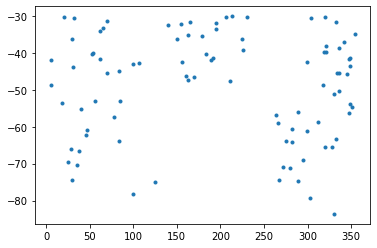

In [9]:
plt.plot(cat["RAJ2000"][selection],cat["DEJ2000"][selection],'.')

I prepare now a file with coordinates for this candidate list, adding the Spiderweb as the first element, to extract unwise cutouts from vizier centered around it.
By default I will extract cutouts with an area of 1deg2 (radius = 0.56418958354deg), and sorted by distance. I require also flag qualities q_W1 and q_W2 to be 1

**The resulting catalog of unwise cutouts is saved from vizier as unwise_cat.fit**

In [10]:
candidates = Table()
ra = spid["RAJ2000"][0]
rac = [i for i in cat["RAJ2000"][selection]]
dec = spid["DEJ2000"][0]
decc = [i for i in cat["DEJ2000"][selection]]
candidates["RAJ2000"] = np.append(ra,rac)*u.deg
candidates["DEJ2000"] = np.append(dec,decc)*u.deg
candidates.write("candidates_pos.tsv",format="ascii.tab",overwrite=True)
ncandidates = len(candidates)
print(ncandidates)

93


The following lines were a try to communicate directly with vizier from the notebook, but there are time limit constraints and thus it is more efficient to do it directly  on the web portal

In [11]:
# Now upload candidates_pos.vot to vizier

In [12]:
# from astroquery.vizier import Vizier
# from astropy.coordinates import Angle
# catalog_list = Vizier.find_catalogs('unwise')
# catalog_list.keys()

In [13]:
#unwise = Vizier.get_catalogs("II/363")
#unwise[0]
#unwise = Vizier(catalog="II/363", column_filters={"q_W1":"=1", "q_W2":"=1"}).query_region(candidates, radius="30m")[0]

In [14]:
#Vizier.ROW_LIMIT = 10
#unwise_cat = Vizier(catalog="II/363", column_filters={"q_W1":"=1", "q_W2":"=1"},columns=["*","+_r"])
#unwise = unwise_cat.query_region(candidates, radius="0.56418958354d")[0]

I compute the AB W1 magnitude of each candidate (maxw1). I will then cut the cutouts to include only galaxies fainter than this limit (e.g., requiring the central to be the brightest).

In [16]:
maxw1 = sucmags[0,0]
maxw1 = np.append(maxw1,[ucmags[i,0] for i in range(ncandidates)])
#print(maxw1)

Upload resulting catalog

In [17]:
unwise=Table.read("/Users/saro/DATA/SPIDERWEB_LIKE/unwise_cat.fit")
unwise

_r,_RAJ2000,_DEJ2000,objID,RAJ2000,DEJ2000,FW1,FW2,e_FW1,e_FW2,q_W1,q_W2,fFW1,fFW2
,deg,deg,,deg,deg,309.05nJy,167.66nJy,309.05nJy,167.66nJy,,,,
float64,float64,float64,bytes16,float64,float64,float32,float32,float32,float32,float64,float64,float64,float64
0.000000,175.201594900,-26.485715800,1757m273o0027002,175.2015949,-26.4857158,8.8757e+02,2.5890e+03,8.5743e+00,3.3560e+01,1.00000,1.00000,0.9423,0.9995
0.000013,175.201604200,-26.485725800,1750m258o0000714,175.2016042,-26.4857258,8.9647e+02,2.6215e+03,8.5947e+00,3.3531e+01,1.00000,1.00000,0.9435,0.9984
0.006721,175.194157900,-26.484789300,1750m258o0030293,175.1941579,-26.4847893,6.2303e+01,1.7408e+02,6.9280e+00,2.8342e+01,1.00000,1.00000,0.4447,0.8079
0.007268,175.193635400,-26.484278100,1757m273o0033181,175.1936354,-26.4842781,4.4909e+01,1.6170e+02,6.8781e+00,2.8541e+01,1.00000,1.00000,0.3482,0.8309
0.007803,175.193576700,-26.488780300,1757m273o0026947,175.1935767,-26.4887803,2.8911e+02,5.1329e+02,7.4605e+00,2.9543e+01,1.00000,1.00000,0.7570,0.9084
0.007830,175.193543200,-26.488777400,1750m258o0000667,175.1935432,-26.4887774,2.9752e+02,5.2045e+02,7.4808e+00,2.9533e+01,1.00000,1.00000,0.7718,0.9008
...,...,...,...,...,...,...,...,...,...,...,...,...,...
0.564108,174.648137500,-26.216912800,1750m258o0005544,174.6481375,-26.2169128,1.8848e+02,2.3812e+02,7.1126e+00,2.8445e+01,1.00000,1.00000,0.9744,0.9746


In [18]:
from astropy.io import fits
hdul = fits.open("/Users/saro/DATA/SPIDERWEB_LIKE/unwise_cat.fit")

Upload unWISE catalog and check distribution of magnitudes. Inspect the histograms to define a reasonable lower limit for cutting faint galaxies

/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:19: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/2562934162.py:7: RuntimeWarning: invalid value encountered in greater
  (W1>W2)&(W1>maxw1[i]))[0]]
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/2562934162.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(i)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:16: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)


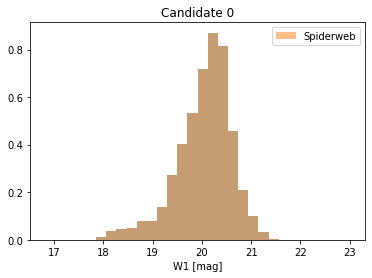

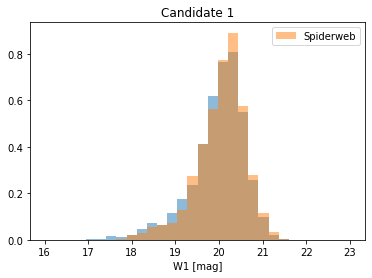

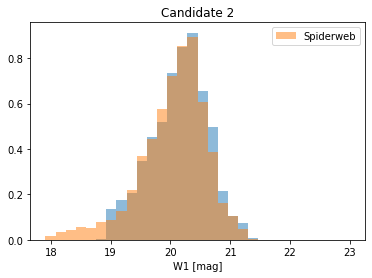

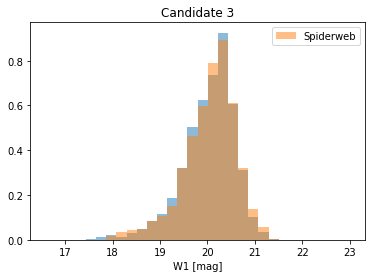

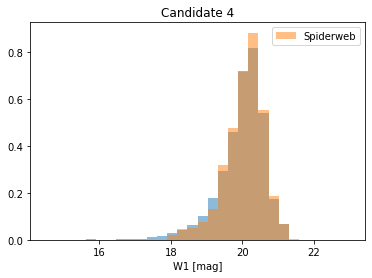

...

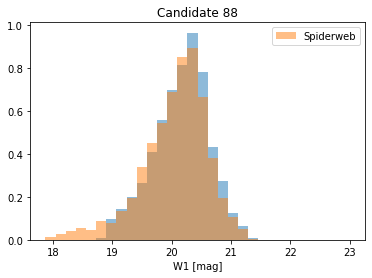

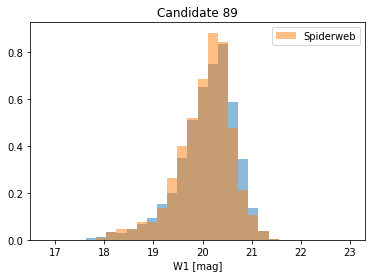

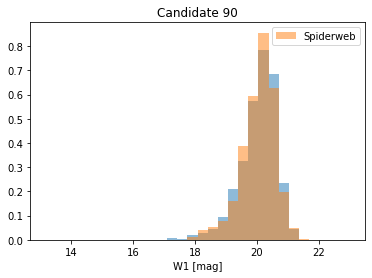

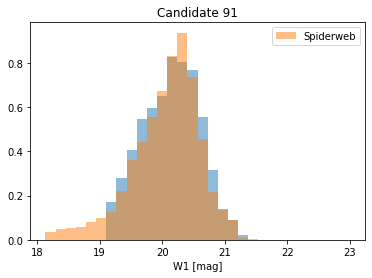

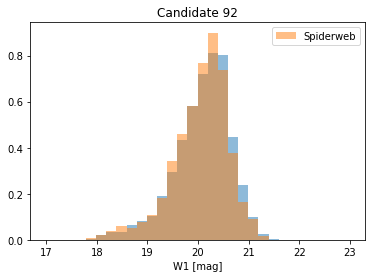

In [19]:
with PdfPages('MagW1_hist.pdf') as pdf:
    for i in range(ncandidates):
        unwise = hdul[i+1].data
        W1=flux2AB_W1(unwise["FW1"])
        W2=flux2AB_W2(unwise["FW2"])
        unwise=unwise[np.where((unwise["q_W1"] == 1)&(unwise["q_W2"] == 1)&
                               (W1>W2)&(W1>maxw1[i]))[0]]
        if i==0:
            spidun=unwise
            W1spid=flux2AB_W1(unwise["FW1"])
        W1=flux2AB_W1(unwise["FW1"])
        plt.figure(i)
        plt.title("Candidate "+str(i))
        plt.hist(W1,bins=30,range=(maxw1[i]-1.,23),alpha=0.5,density=True)
        plt.hist(W1spid,bins=30,range=(maxw1[i]-1.,23),alpha=0.5,label="Spiderweb",density=True)
        plt.xlabel("W1 [mag]")
        plt.legend()
        pdf.savefig()

From the above plot define a W1 AB lower cut (minw1) at 20

In [20]:
minw1 = 20.

# Define cuts of unWISE catalogs:

**1 - Quality flags q_W1 and q_W2 = 1** (This should be already the case if imposed on vizier) -> (unwise["q_W1"] == 1)&(unwise["q_W2"] == 1)

**2 - W1 > W2 (AB)** -> (W1>W2)

**3 - W1 magnitude between the central candidate magnitude and the above estimated lower limit** -> (W1=<minw1)&(W1>=maxw1) 

0 1187 0.0
1 1355 0.9990446416773301
2 1100 14.631516137983095
3 1351 35.936265550253886
4 1472 0.629427045826005
5 1172 1.6055125067791234
6 1078 0.868481152813588
7 1228 49.41938906716452
8 1195 2.941534201360341
9 1194 4.320930012579686
10 1116 39.86379621687621


/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:19: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]


11 1217 1.423574091827673
12 1148 27.505903029249986
13 1216 56.16835053518427
14 1308 1.2228059344616662
15 955 1.9070021778868111
16 1285 2.803150137681552
17 1211 58.25417037441363
18 1036 17.167419721083288
19 1106 3.857113711115745
20 1193 1.2250579173865126
21 1323 6.090791900970334


/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(i)


22 1077 1.2113272598688363
23 1043 2.764689261098562
24 1209 1.0877642504009402
25 1139 80.30892315964469
26 1319 2.8812159703905236
27 1462 0.7718429238096124
28 1080 59.62099380770732
29 1295 3.5389260133697036
31 1253 0.23867737106439915
32 1195 56.770256776960004
33 1166 1.3167281689443573
34 1039 0.7165130676436973
35 1255 0.2625687516797793
37 1190 3.094925271928539
38 1412 1.4164413098903732
39 1321 0.989498775086861
40 1234 3.149596695454383
41 1379 2.425837509821763
42 1249 1.0593813943535122
43 1473 2.6421791224303033
44 1318 85.81276710550156
45 1279 0.9251061959061879


/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:16: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in less_equal
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater_equal
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:16: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater
  (W1>W2)&

46 1353 53.77706823807752
47 1229 2.5220701748746785
48 1240 70.61869388954082
49 1173 1.2352241936997241
50 1357 3.2926972754411414
51 986 25.301249989422953
52 1184 1.3051815075447548
53 1431 3.305879393137825
54 1228 1.8708476020421974
55 1434 1.5879824480357296
56 963 59.86038914038161


/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:16: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in less_equal
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater_equal
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:19: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater
  (W1>W2)&

57 784 31.432397947335467
58 1454 1.0235168161891368
59 1240 1.8281928316762834
60 561 60.72405158802593
61 1192 23.42407327275518
62 1624 1.6422841504021546
63 1292 1.4993264406500002
64 1174 2.878756875955216
65 1285 2.2424270197490235
66 1185 11.753441616610623
67 1259 47.3501725373257


/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:16: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in less_equal
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater_equal
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]


68 881 30.429838696616514
69 1591 66.76072290488985
70 1239 3.5162806175326335
71 1379 1.5198546226684773
72 657 112.81312495248758
73 1157 41.3423352174024
74 1441 0.16675695580249053


/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:19: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:19: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]


75 1123 19.393868810411988
76 1340 21.328667442902834
77 1293 2.366794314478131
78 820 112.15950632465447
79 1251 0.7179517905401976
80 1272 2.1378874783649118
81 1328 0.6066251456933744
82 326 89.81642505319124
83 1092 1.2090376608521873
84 1265 1.0364807040211852
85 1431 2.612682396293051
86 1249 43.34915913292403
87 1216 2.6705129871856683
88 1067 15.735349918788192
89 1314 0.9099435467233787
90 1271 1.833838692792594
91 1106 31.849199888386607
92 1284 45.1039199969639


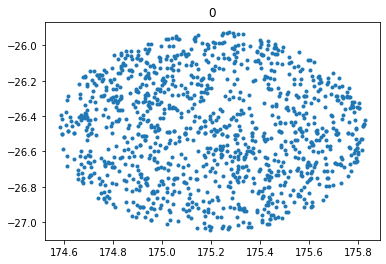

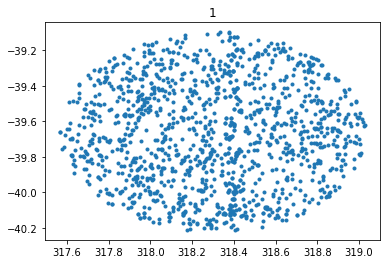

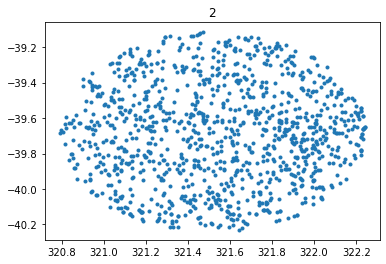

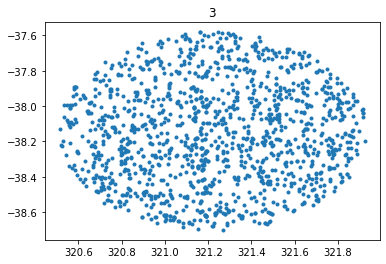

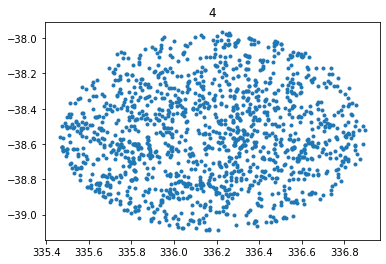

...

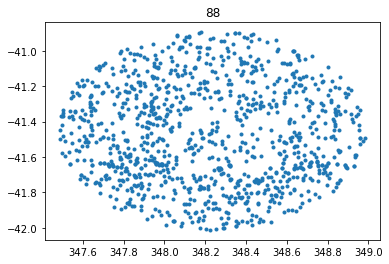

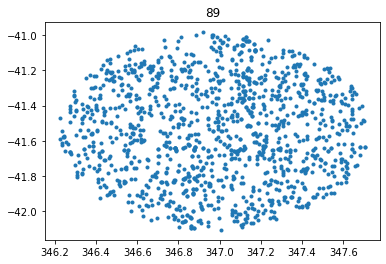

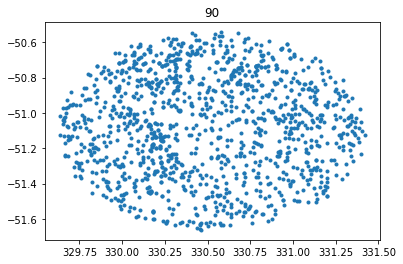

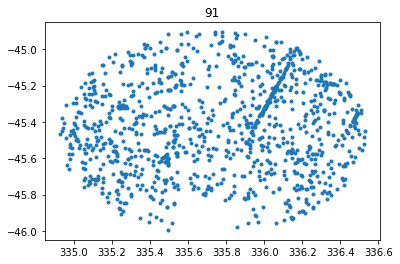

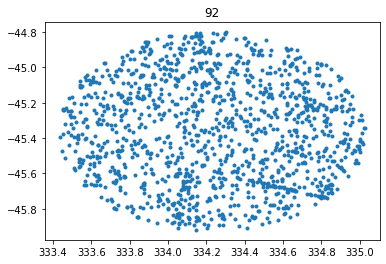

In [21]:
def unwise_sel(unwise,maxw1):
    W1=flux2AB_W1(unwise["FW1"])
    W2=flux2AB_W2(unwise["FW2"])
    unwise=unwise[np.where((unwise["q_W1"] == 1)&(unwise["q_W2"] == 1)&
                               (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]
    return unwise
ic = 0
for i in range(ncandidates):
    unwise = hdul[i+1].data
    unwise=unwise_sel(unwise,maxw1[i])
    if len(unwise)>0:
        print(i,len(unwise),unwise["_r"].min()*60*60)
        plt.figure(i)
        plt.title(i)
        plt.plot(unwise["RAJ2000"],unwise["DEJ2000"],'.')

# Define inner and outer radius for the local background computation
Currently inner_bk = 7.5' and outer_bk = 15'

Also define minimum number of galaxies to evaluate overdensity (currently Nmin = 5)

In [23]:
inner_bk=7.5/60.
outer_bk=np.sqrt(1/np.pi)#/60.
outer_bk=15/60.

oubs = "{0:.1f}".format(outer_bk*60)
inbs = "{0:.1f}".format(inner_bk*60)
strdel = r"$\delta = \frac{\Sigma(<r) - \Sigma_{"+str(inbs)+"^\prime-"+str(oubs)+"^\prime}}{\Sigma_{"+str(oubs)+"^\prime-"+str(oubs)+"^\prime}}$"

Nmin = 5

Compute overdensity of each candidates:

\begin{equation}
    \delta(<r) = \frac{\Sigma(<r) - \Sigma_{7.5^\prime-15^\prime}}{\Sigma_{7.5^\prime-15^\prime}}
\end{equation}

0 1187
1 1355
2 1100
3 1351
4 1472
5 1172
6 1078
7 1228


/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:19: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]


8 1195
9 1194
10 1116
11 1217
12 1148
13 1216
14 1308
15 955
16 1285
17 1211
18 1036
19 1106
20 1193
21 1323


/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/408421393.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(i)


22 1077
23 1043
24 1209
25 1139
26 1319
27 1462
28 1080
29 1295
31 1253
32 1195
33 1166
34 1039
35 1255


/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:16: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in less_equal
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater_equal
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]


37 1190
38 1412


/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:16: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in less_equal
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater_equal
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]


39 1321
40 1234
41 1379
42 1249
43 1473
44 1318
45 1279
46 1353
47 1229
48 1240
49 1173
50 1357
51 986


/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:16: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in less_equal
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater_equal
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]


52 1184
53 1431
54 1228
55 1434


/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:19: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]


56 963
57 784
58 1454
59 1240
60 561
61 1192


/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:16: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in less_equal
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater_equal
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]


62 1624
63 1292
64 1174
65 1285
66 1185
67 1259
68 881
69 1591
70 1239
71 1379
72 657
73 1157
74 1441


/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:19: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]


75 1123
76 1340


/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:19: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]


77 1293
78 820
79 1251
80 1272
81 1328
82 326
83 1092
84 1265
85 1431
86 1249
87 1216
88 1067
89 1314
90 1271
91 1106
92 1284


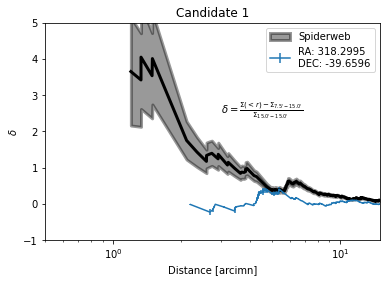

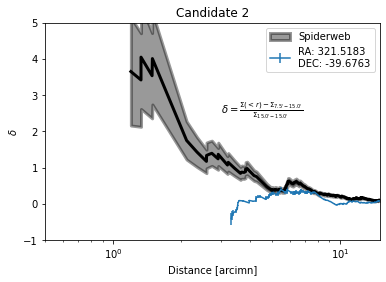

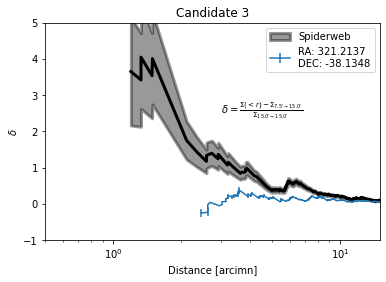

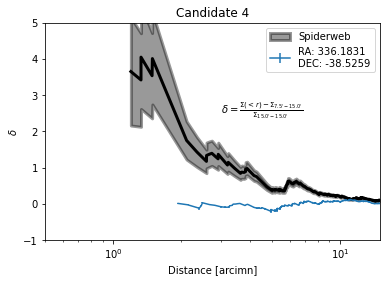

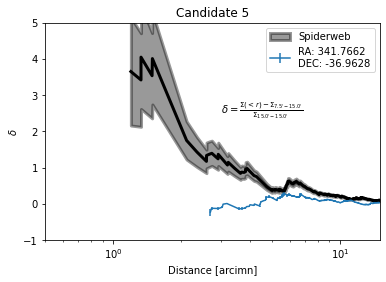

...

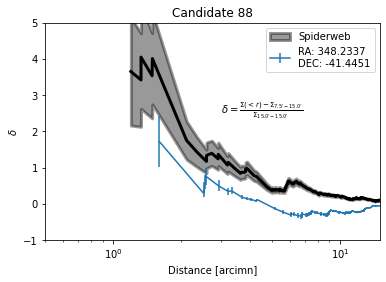

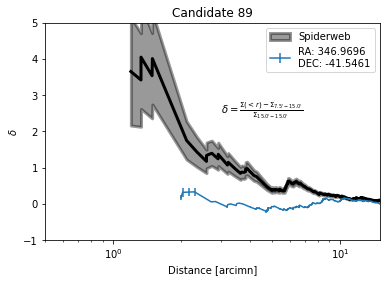

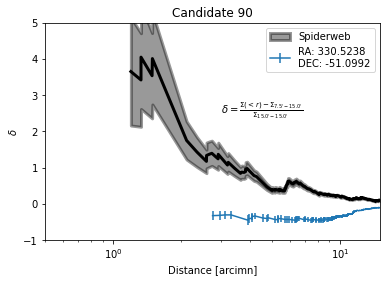

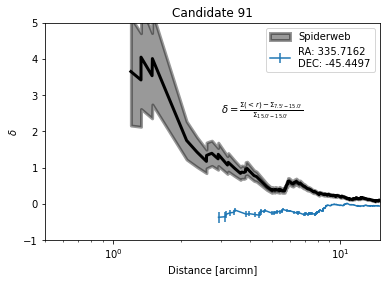

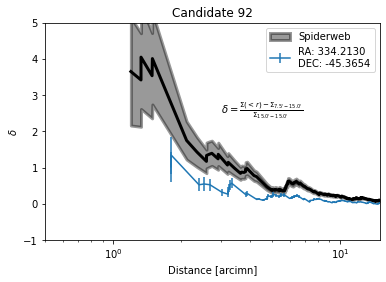

In [24]:
with PdfPages('candidates.pdf') as pdf:
    for i in range(ncandidates):
        unwise = hdul[i+1].data
        unwise=unwise_sel(unwise,maxw1[i])
        if len(unwise)>0:
            bkg = len(np.where((unwise["_r"]>inner_bk)&(unwise["_r"]<outer_bk))[0])/(((outer_bk)**2-(inner_bk**2))*np.pi)
            idx = np.arange(len(unwise))+1
            area_ring = unwise["_r"]**2*np.pi
            expected=bkg*area_ring
            print(i,len(unwise))
            if i==0:
                xspid = unwise["_r"][Nmin:]*60
                yspid = (idx[Nmin:]-expected[Nmin:])/expected[Nmin:]
                eyspid = np.sqrt(1./idx[Nmin:])*(idx[Nmin:]-expected[Nmin:])/expected[Nmin:]
            else:
                xx = unwise["_r"][Nmin:]*60
                yy = (idx[Nmin:]-expected[Nmin:])/expected[Nmin:]
                eyy = np.sqrt(1./idx[Nmin:])*(idx[Nmin:]-expected[Nmin:])/expected[Nmin:]

                plt.figure(i)
                plt.title("Candidate "+str(i))
                COM="RA: {0:.4f}\nDEC: {1:.4f}".format(unwise["RAJ2000"][np.argmin(unwise["_r"])],
                                                      unwise["DEJ2000"][np.argmin(unwise["_r"])])
                plt.errorbar(xx,yy,eyy,label=COM)
                plt.fill_between(xspid,yspid-eyspid,yspid+eyspid,color="black",linewidth=3,label="Spiderweb",alpha=0.4)
                plt.plot(xspid,yspid,color="black",linewidth=3)
                plt.text(3,2.5,strdel)
                plt.xlim(0.5,15)
                plt.ylim(-1,5)
                plt.xscale("log")
                plt.legend()
                plt.xlabel("Distance [arcimn]")
                plt.ylabel(r'$\delta$')
                pdf.savefig()

Compute W1 - W2 colors

/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:19: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/1948197802.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(i)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:16: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater

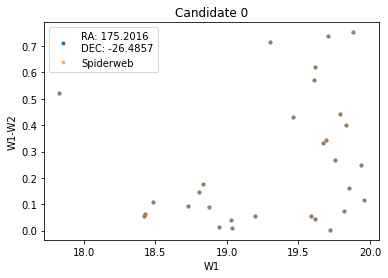

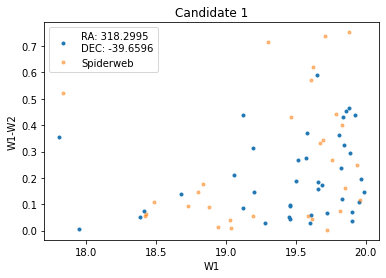

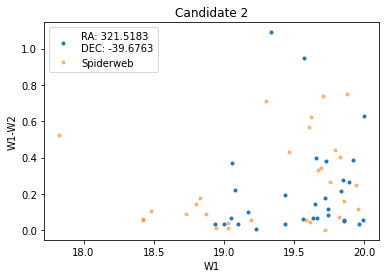

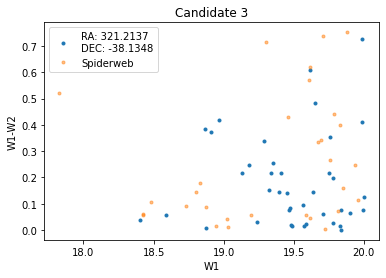

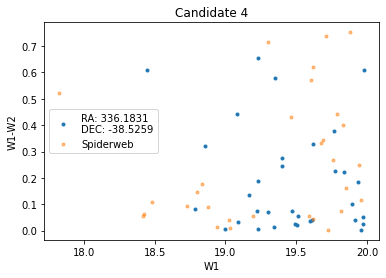

...

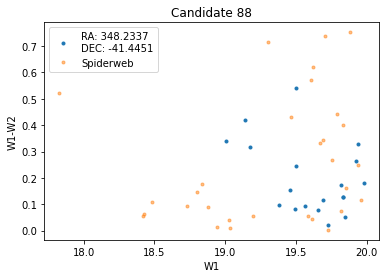

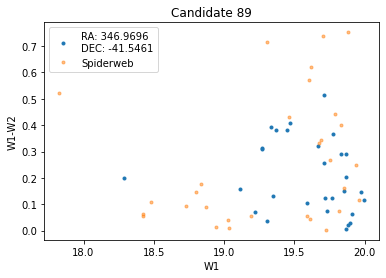

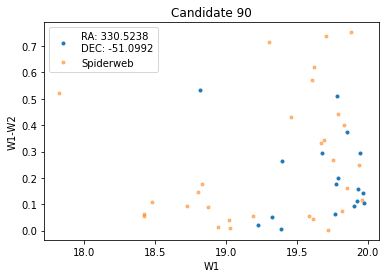

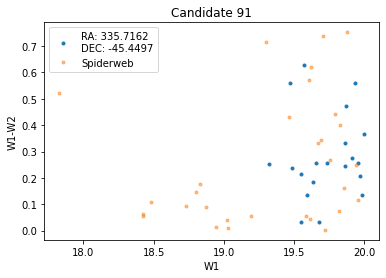

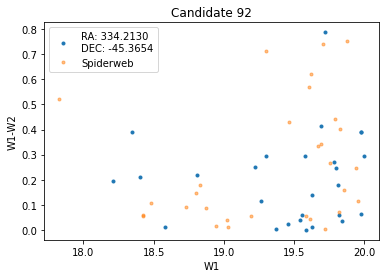

In [25]:
with PdfPages('candidates_colors.pdf') as pdf:
    for i in range(ncandidates):
        unwise = hdul[i+1].data
        unwise=unwise_sel(unwise,maxw1[i])
        if len(unwise)>0:
            W1=flux2AB_W1(unwise["FW1"])
            W2=flux2AB_W2(unwise["FW2"])
            core=np.where(unwise["_r"]<5./60.)[0]
            if i==0:
                W1sp = W1[core]
                W2sp = W2[core]
            plt.figure(i)
            plt.title("Candidate "+str(i))
            COM="RA: {0:.4f}\nDEC: {1:.4f}".format(unwise["RAJ2000"][np.argmin(unwise["_r"])],
                                                  unwise["DEJ2000"][np.argmin(unwise["_r"])])
            plt.plot(W1[core],W1[core]-W2[core],".",label=COM)
            plt.plot(W1sp,W1sp-W2sp,".",label="Spiderweb",alpha=0.5)
            plt.legend()
            plt.xlabel("W1")
            plt.ylabel("W1-W2")
            pdf.savefig()

# Now assign significance of the overdensity

- First compute the P-value deined as the Poisson probability as a function of distance of observing $N>N_\mathrm{obs}$ galaxies with expectaction value given by the local background estimated between inner and outer ring (7.5 and 15).
- Then define the SN of the detection as the $\sigma$ of the error function corresponding to the same P-value estimated above.
-Finally take maximum SN obtained within $10^\prime$

0 1187
1 1355
2 1100
3 1351
4 1472
5 1172
6 1078
7 1228


/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:19: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]


8 1195
9 1194
10 1116
11 1217
12 1148
13 1216
14 1308
15 955
16 1285
17 1211
18 1036
19 1106
20 1193
21 1323


/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3833648320.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(i)


22 1077
23 1043
24 1209
25 1139
26 1319
27 1462
28 1080
29 1295
31 1253
32 1195
33 1166
34 1039
35 1255


/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:16: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in less_equal
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater_equal
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]


37 1190
38 1412


/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:16: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in less_equal
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater_equal
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]


39 1321
40 1234
41 1379
42 1249
43 1473
44 1318
45 1279


/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:85: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


46 1353
47 1229
48 1240
49 1173
50 1357
51 986


/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:16: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in less_equal
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater_equal
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]


52 1184
53 1431
54 1228
55 1434


/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:19: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]


56 963
57 784
58 1454
59 1240
60 561
61 1192


/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:16: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in less_equal
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater_equal
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]


62 1624
63 1292
64 1174
65 1285
66 1185
67 1259
68 881
69 1591
70 1239
71 1379
72 657
73 1157
74 1441


/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:19: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]


75 1123
76 1340


/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/4076170639.py:19: RuntimeWarning: invalid value encountered in log10
  vega=22.5-2.5*np.log10(f)
/var/folders/w_/jqct14c104d3tbyx86t9wdch0000gn/T/ipykernel_38320/3817000619.py:5: RuntimeWarning: invalid value encountered in greater
  (W1>W2)&(W1<=minw1)&(W1>=maxw1))[0]]


77 1293
78 820
79 1251
80 1272
81 1328
82 326
83 1092
84 1265
85 1431
86 1249
87 1216
88 1067
89 1314
90 1271
91 1106
92 1284


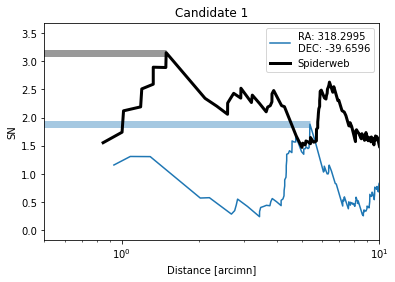

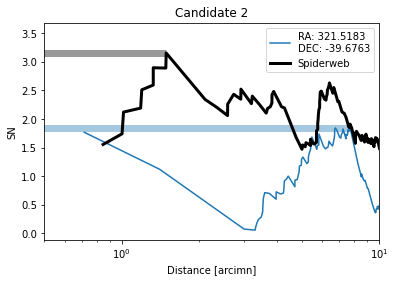

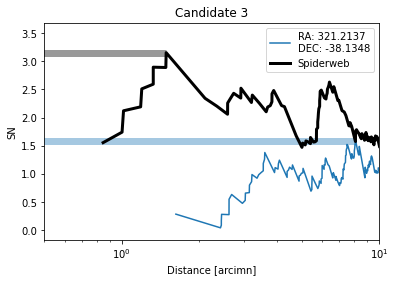

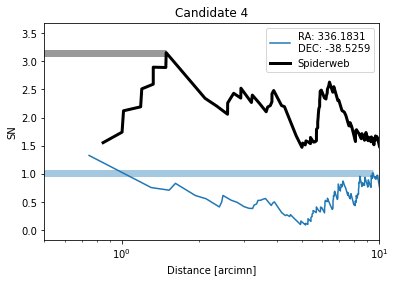

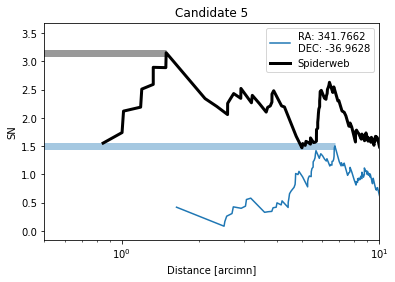

...

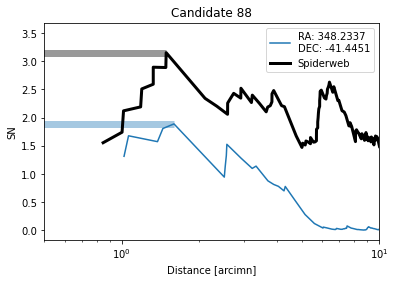

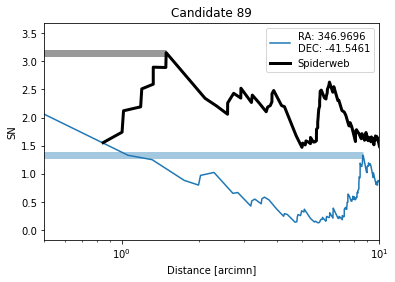

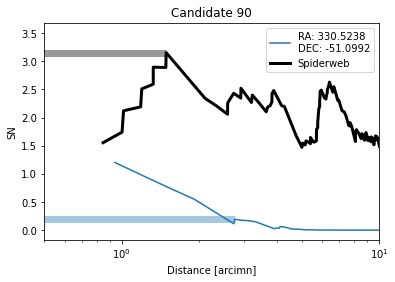

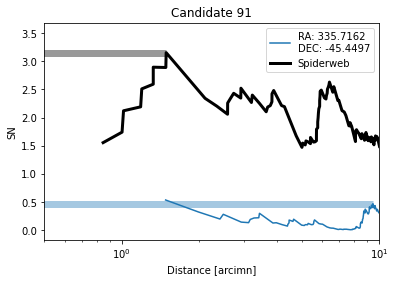

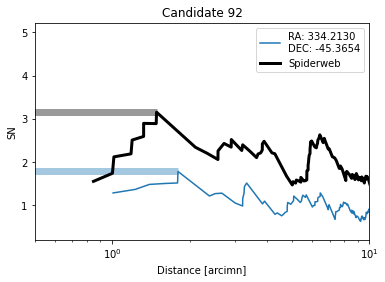

In [27]:
SN = np.zeros(ncandidates)
RMC = np.zeros(ncandidates)
with PdfPages('candidates_Pval.pdf') as pdf:
    for i in range(ncandidates):
        unwise = hdul[i+1].data
        unwise=unwise_sel(unwise,maxw1[i])
        if len(unwise)>0:
            bkg = len(np.where((unwise["_r"]>inner_bk)&
                               (unwise["_r"]<outer_bk))[0])/(((outer_bk)**2-(inner_bk**2))*np.pi)
            idx = np.arange(len(unwise))+1
            area_ring = unwise["_r"]**2*np.pi
            expected=bkg*area_ring
            print(i,len(unwise))
            if i==0:
                xspid = unwise["_r"]*60
                qyspid = [poisson.cdf(idx[jj],expected[jj]) for jj in range(len(expected))]
                #eyspid = np.sqrt(1./idx)*(idx-expected)/expected
                sitx = np.where(xspid<10)[0]
                smax = np.argmax(erfinv(qyspid[Nmin:sitx[-1]]))+Nmin
                SN[i] = erfinv(qyspid[smax])
            else:
                plt.figure(i)
                plt.title("Candidate "+str(i))
                COM="RA: {0:.4f}\nDEC: {1:.4f}".format(unwise["RAJ2000"][np.argmin(unwise["_r"])],
                                                      unwise["DEJ2000"][np.argmin(unwise["_r"])])
                yy = [poisson.cdf(idx[jj],expected[jj]) for jj in range(len(expected))]
                plt.plot(unwise["_r"][1:]*60,erfinv(yy[1:]),label=COM)
                itx = np.where(unwise["_r"]*60<10)[0]
                itmax = np.argmax(erfinv(yy[Nmin:itx[-1]]))+Nmin
                
                plt.hlines(erfinv(yy[itmax]),0,unwise["_r"][itmax]*60,alpha=0.4,linewidth=7)
                SN[i] = erfinv(yy[itmax])
                RMC[i] = unwise["_r"][itmax]*60
#                plt.errorbar(xspid,yspid,eyspid,color="black",linewidth=3,label="Spiderweb")
                plt.plot(xspid[1:],erfinv(qyspid[1:]),color="black",linewidth=3,label="Spiderweb")
                plt.hlines(SN[0],0,xspid[smax],"k",alpha=0.4,linewidth=7)
                #plt.plot(xspid,yspid,color="black",linewidth=3)
                #plt.text(3,2.5,strdel)

                #P_det=1-poisson.pmf(idx, expected)
                #plt.loglog(50unwise["_r"]*60,P_det)
                #plt.ylim(0,1)
                #plt.yscale("log")
                plt.xlim(0.5,10)
                plt.xscale("log")
                plt.legend()
                plt.xlabel("Distance [arcimn]")
                plt.ylabel('SN')
                pdf.savefig()

# Select good candidates as the ones with a SN of the detection larger than the Spiderweb

Error function numerically fails above 6$\sigma$. Correct inf to 6.

Ngood:  8


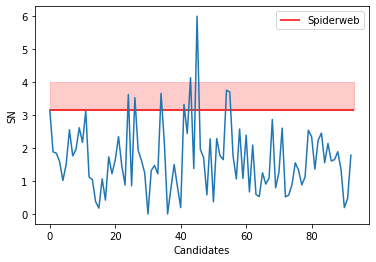

In [31]:
plt.plot(SN)
plt.hlines(SN[0],0,ncandidates,'r',label="Spiderweb")
plt.fill_between([0,ncandidates],[SN[0],SN[0]],[4,4],color="red",alpha=0.2)
plt.xlabel("Candidates")
plt.ylabel("SN")
highSN = np.where(SN>SN[0])[0]
if (any(SN[highSN] == np.inf)):
    ii = np.where(SN[highSN] == np.inf)[0]
    SN[highSN[ii]]  = 6.

#for i in candidates[highSN]:
#    print(i["RAJ2000"],i["DEJ2000"],)
plt.legend()

good1s = candidates[highSN]
good1s["ID"]=[str(i) for i in highSN]
good1s["SN"] = SN[highSN]
good1s["RMC"] = RMC[highSN]
good1s["W1"] = ucmags[selection[highSN-1],0]
good1s["eW1"] = udcmags[selection[highSN-1],0]
good1s["W2"] = ucmags[selection[highSN-1],1]
good1s["eW2"] = udcmags[selection[highSN-1],1]
good1s["W3"] = ucmags[selection[highSN-1],2]
good1s["eW3"] = udcmags[selection[highSN-1],2]
good1s["W4"] = ucmags[selection[highSN-1],3]
good1s["eW4"] = udcmags[selection[highSN-1],3]

good1s.write("GoodOnes_"+inbs+"_"+oubs+".tvs",format="ascii.tab")
print("Ngood: ",len(highSN))

Text(0, 0.5, 'SN')

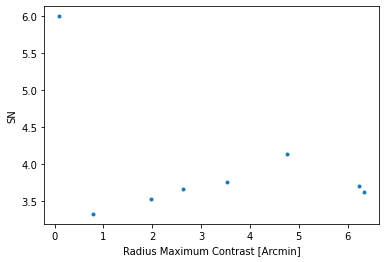

In [32]:
plt.plot(RMC[highSN],SN[highSN],'.')
plt.xlabel("Radius Maximum Contrast [Arcmin]")
plt.ylabel("SN")

# Compare results obtained with different bkg choices

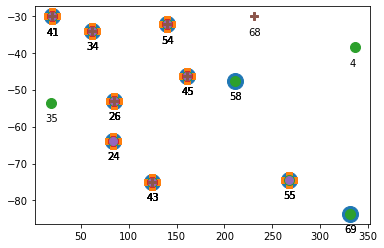

In [35]:
import glob
o = 0
msit = [16,16,10,10,8,8]
mstt = ["o","P","o","P","o","P"]
for file in glob.glob("GoodO*"): 
    T=Table.read(file,format="ascii.tab")
    plt.plot(T["RAJ2000"],T["DEJ2000"],mstt[o],alpha=1,label=file,markersize=msit[o])
    for j in T:
        plt.text(j["RAJ2000"]-6,j["DEJ2000"]-5.,j["ID"])
    o = o+1
#plt.legend()

Candidate 45 seems odd.. There are several sources with almost identical coordinates and is the only one where the resulting maximum contrast is in the centre. Probably fake sources? 

Re-edit: Candidate 45 is this guy here: ESO 264-G036


Text(0.5, 1.0, 'Candidate 45 sources. The central six sources have 2 identical coordinates ')

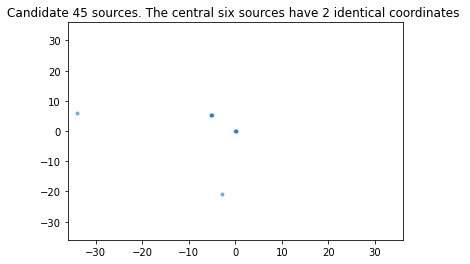

In [37]:
unwise = hdul[46].data
unwise=unwise_sel(unwise,maxw1[45])
plt.plot((unwise["RAJ2000"]-unwise["RAJ2000"][ic])*3600,
         (unwise["DEJ2000"]-unwise["DEJ2000"][ic])*3600,'.',alpha=0.5)
ic = np.argmin(unwise["_r"])
plt.ylim(-0.01*3600,0.01*3600)
plt.xlim(-0.01*3600,0.01*3600)
plt.title("Candidate 45 sources. The central six sources have 2 identical coordinates ")

In [38]:
print(unwise["RAJ2000"][0:6],unwise["DEJ2000"][0:6])

[160.8223287 160.8223412 160.8223432 160.8209029 160.8208847 160.8208633] [-46.1755671 -46.1755787 -46.1755659 -46.1741302 -46.1741228 -46.1741224]


# Identify the following candidates as the ones which are consistently found even with different background choices (minus candidate 45)

In [43]:
FinalOnes = np.array([26,34,41,43,54])

# Plot SED

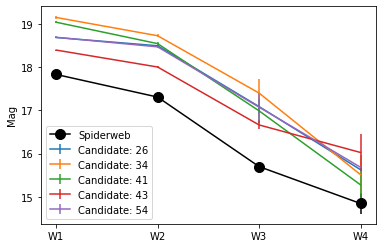

In [45]:
channel = [1,2,3,4]
plt.errorbar(channel,sucmags[0,:],sudcmags[0,:],marker="o",label="Spiderweb",markersize=10,color="black")
for i in FinalOnes:
    plt.errorbar(channel,ucmags[selection[i-1],:],udcmags[selection[i-1],:],label="Candidate: "+str(i))
plt.xticks(ticks = [1,2,3,4],labels = ["W1","W2","W3","W4"])
plt.ylabel("Mag")
plt.legend()

# Letizia

In [ ]:
lt = Table.read("20ogg",format="ascii")
lt

In [ ]:
ltc = Table()
ltc["RAJ2000"] = lt["ra"]*u.deg
ltc["DEJ2000"] = lt["dec"] *u.deg
ltc.write("LT_candidates_pos.vot",format="votable",overwrite=True)
ltc.write("LT_candidates_pos.tsv",format="ascii.tab",overwrite=True)
nltc = len(ltc)

In [ ]:
plt.plot(candidates["RAJ2000"],candidates["DEJ2000"],'.',label="Mine")
plt.plot(lt["ra"],lt["dec"],'.',label="Letizia")
plt.xlabel("RA")
plt.ylabel("DEC")
plt.legend()
plt.savefig("Letizia_comparison.png")

In [ ]:
lhdul = fits.open("/Users/saro/DATA/SPIDERWEB_LIKE/lt_unwise_cat.fit")
            
with PdfPages('LT_candidates.pdf') as pdf:
    for i in range(nltc):
        lunwise = lhdul[i+1].data
        lW1=flux2AB_W1(lunwise["FW1"])
        lW2=flux2AB_W2(lunwise["FW2"])
        lmaxw1=lW1[np.argmin(lunwise["_r"])]
        lunwise=unwise_sel(lunwise,lmaxw1)
        if len(lunwise)>0:
            bkg = len(np.where((lunwise["_r"]>inner_bk)&(lunwise["_r"]<outer_bk))[0])/(((outer_bk)**2-(inner_bk**2))*np.pi)
            idx = np.arange(len(lunwise))+1
            area_ring = lunwise["_r"]**2*np.pi
            expected=bkg*area_ring
            print(i,len(lunwise))
            plt.figure(i)
            plt.title("Letizia Candidate "+str(i))
            COM="RA: {0:.4f}\nDEC: {1:.4f}".format(lunwise["RAJ2000"][np.argmin(lunwise["_r"])],
                                                  lunwise["DEJ2000"][np.argmin(lunwise["_r"])])
            plt.errorbar(lunwise["_r"]*60,(idx-expected)/expected,np.sqrt(1./idx)*(idx-expected)/expected,label=COM)
#                plt.errorbar(xspid,yspid,eyspid,color="black",linewidth=3,label="Spiderweb")
            plt.fill_between(xspid,yspid-eyspid,yspid+eyspid,color="black",linewidth=3,label="Spiderweb",alpha=0.4)
            plt.plot(xspid,yspid,color="black",linewidth=3)
            plt.text(3,2.5,strdel)

            #P_det=1-poisson.pmf(idx, expected)
            #plt.loglog(50unwise["_r"]*60,P_det)
            plt.ylim(-0.3,3)
            #plt.yscale("log")
            plt.xlim(1,15)
            plt.xscale("log")
            plt.legend()
            plt.xlabel("Distance [arcimn]")
            plt.ylabel(r'$\delta$')
            pdf.savefig()